# Data Science Unit 4 Sprint Challenge 1 — Tree Ensembles

### Chicago Food Inspections

For this Sprint Challenge, you'll use a dataset with information from inspections of restaurants and other food establishments in Chicago from January 1, 2010 to the present. 

[See this PDF](https://data.cityofchicago.org/api/assets/BAD5301B-681A-4202-9D25-51B2CAE672FF) for descriptions of the data elements included in this dataset.

According to [Chicago Department of Public Health — Food Protection Services](https://www.chicago.gov/city/en/depts/cdph/provdrs/healthy_restaurants/svcs/food-protection-services.html), "Chicago is home to 16,000 food establishments like restaurants, grocery stores, bakeries, wholesalers, lunchrooms, mobile food vendors and more. Our business is food safety and sanitation with one goal, to prevent the spread of food-borne disease. We do this by inspecting food businesses, responding to complaints and food recalls." 

#### Your challenge: Predict whether inspections failed

The target is the `Fail` column.

- When the food establishment failed the inspection, the target is `1`.
- When the establishment passed, the target is `0`.

## Data Description

    • DBA: ‘Doing business as.’ This is legal name of the establishment.
    
    • AKA: ‘Also known as.’ This is the name the public would know the establishment as.
    
    • License number: This is a unique number assigned to the establishment for the purposes of licensing by the Department of Business Affairs and Consumer Protection.

**Categorical - GOOD ONE TO TARGET ENCODE**

    • Type of facility: Each establishment is described by one of the following: bakery, banquethall, candy store, caterer, coffee shop, day care center (for ages less than 2), day carecenter (for ages 2 – 6), day care center (combo, for ages less than 2 and 2 – 6combined), gas station, Golden Diner, grocery store, hospital, long term care center(nursing home), liquor store, mobile food dispenser, restaurant, paleteria, school, shelter, tavern, social club, wholesaler, or Wrigley Field Rooftop. 

**Ordinal, Numeric**

    • Risk category of facility: Each establishment is categorized as to its risk of adversely affecting the public’s health, with 1 being the highest and 3 the lowest. The frequency of inspection is tied to this risk, with risk 1 establishments inspected most frequently and risk 3 least frequently.

**May be some corrilation to socio-economic factors**    
    
    • Street address, city, state and zip code of facility: This is the complete address where the facility is located.

**Can use to create freqeuency of inspection and time since last inspection features**

    • Inspection date: This is the date the inspection occurred. A particular establishment is likely to have multiple inspections which are denoted by different inspection dates.

**This one is categorical, non-ordinal. Would be a great one to target encode**
    
    • Inspection type: An inspection can be one of the following types: canvass, the most common type of inspection performed at a frequency relative to the risk of the establishment; consultation, when the inspection is done at the request of the owner prior to the opening of the establishment; complaint, when the inspection is done in response to a complaint against the establishment; license, when the inspection is done as a requirement for the establishment to receive its license to operate; suspect food poisoning, when the inspection is done in response to one or more persons claiming to have gotten ill as a result of eating at the establishment (a specific type of complaint- based inspection); task-force inspection, when an inspection of a bar or tavern is done. Re-inspections can occur for most types of these inspections and are indicated as such.
    
**The Target Variable** 

    • Results: An inspection can pass, pass with conditions or fail. Establishments receiving a ‘pass’ were found to have no critical or serious violations (violation number 1-14 and 15- 29, respectively). Establishments receiving a ‘pass with conditions’ were found to have critical or serious violations, but these were corrected during the inspection. Establishments receiving a ‘fail’ were found to have critical or serious violations that were not correctable during the inspection. An establishment receiving a ‘fail’ does not necessarily mean the establishment’s licensed is suspended. Establishments found to be out of business or not located are indicated as such.
    
    • Violations: An establishment can receive one or more of 45 distinct violations (violation numbers 1-44 and 70). For each violation number listed for a given establishment, the requirement the establishment must meet in order for it to NOT receive a violation is noted, followed by a specific description of the findings that caused the violation to be issued. 
   

#### Run this cell to load the data:

In [19]:
import numpy as np
import matplotlib.pyplot as plt
from math import cos, sin

seed = 42
#!pip install category_encoders
#!pip install xgboost 
#!pip install pdpbox
import xgboost as xgb
import shap
from pdpbox.pdp import pdp_isolate, pdp_plot
from sklearn.preprocessing import Normalizer
from sklearn.preprocessing import LabelEncoder, OneHotEncoder, OrdinalEncoder, RobustScaler, StandardScaler, PolynomialFeatures
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.feature_selection import f_classif, chi2, SelectKBest
from sklearn.metrics import accuracy_score, f1_score, confusion_matrix, roc_auc_score
from category_encoders.hashing import HashingEncoder
from category_encoders.binary import BinaryEncoder
from xgboost import XGBClassifier
from sklearn.model_selection import cross_validate
from sklearn.model_selection import KFold

In [3]:
import pandas as pd

train_url = 'https://drive.google.com/uc?export=download&id=13_tP9JpLcZHSPVpWcua4t2rY44K_s4H5'
test_url  = 'https://drive.google.com/uc?export=download&id=1GkDHjsiGrzOXoF_xcYjdzBTSjOIi3g5a'

train = pd.read_csv(train_url)
test  = pd.read_csv(test_url)

assert train.shape == (51916, 17)
assert test.shape  == (17306, 17)

### Part 1: Preprocessing

You may choose which features you want to use, and whether/how you will preprocess them. You may use any tools and techniques for categorical encoding. (Pandas, category_encoders, sklearn.preprocessing, or any other library.)

_To earn a score of 3 for this part, engineer new features, and use any alternative categorical encoding instead of One-Hot or Ordinal/Label encoding._

In [4]:
# Baseline of Pass/Fail
train.Fail.value_counts(normalize=True)

0    0.74139
1    0.25861
Name: Fail, dtype: float64

In [5]:
train.head(3)

,Inspection ID,DBA Name,AKA Name,License #,Facility Type,Risk,Address,City,State,Zip,Inspection Date,Inspection Type,Violations,Latitude,Longitude,Location,Fail
0,2088270,"TOM YUM RICE & NOODLE, INC.",TOM YUM CAFE,2354911.0,Restaurant,Risk 1 (High),608 W BARRY,CHICAGO,IL,60657.0,2017-09-15T00:00:00,Canvass,3. POTENTIALLY HAZARDOUS FOOD MEETS TEMPERATUR...,41.938007,-87.644755,"{'longitude': '-87.6447545707008', 'latitude':...",1
1,555268,FILLING STATION & CONVENIENCE STORE,FILLING STATION & CONVENIENCE STORE,1044901.0,Grocery Store,Risk 3 (Low),6646-6658 S WESTERN AVE,CHICAGO,IL,60636.0,2011-10-20T00:00:00,Complaint Re-Inspection,32. FOOD AND NON-FOOD CONTACT SURFACES PROPERL...,41.772402,-87.683603,"{'longitude': '-87.68360273081268', 'latitude'...",0
2,1751394,A P DELI,A P DELI,47405.0,Restaurant,Risk 1 (High),2025 E 75TH ST,CHICAGO,IL,60649.0,2016-04-05T00:00:00,Canvass Re-Inspection,"35. WALLS, CEILINGS, ATTACHED EQUIPMENT CONSTR...",41.758779,-87.575054,"{'longitude': '-87.57505446746121', 'latitude'...",0


In [6]:
# Check Value Counts for Columns
# Output Cleared
counts_ = []
features = list(train.columns)

fc = []
for x in features: fc.append([x, train[x].nunique()])
pd.DataFrame(data=fc, columns = ['features','counts']).sort_values(by=['counts']).set_index(['features'])

,counts
features,
State,1
Fail,2
Risk,3
City,39
Inspection Type,51
Zip,86
Facility Type,329
Inspection Date,2257
Location,13410


In [7]:
# Based on the most voted answer we can easily define a function that gives us a dataframe to preview the missing values and the % of missing values in each column:
def missing_values_table(df):
        mis_val = df.isnull().sum()
        mis_val_percent = 100 * df.isnull().sum() / len(df)
        mis_val_table = pd.concat([mis_val, mis_val_percent], axis=1)
        mis_val_table_ren_columns = mis_val_table.rename(
        columns = {0 : 'Missing Values', 1 : '% of Total Values'})
        mis_val_table_ren_columns = mis_val_table_ren_columns[
            mis_val_table_ren_columns.iloc[:,1] != 0].sort_values(
        '% of Total Values', ascending=False).round(1)
        print ("Your selected dataframe has " + str(df.shape[1]) + " columns.\n"      
            "There are " + str(mis_val_table_ren_columns.shape[0]) +
              " columns that have missing values.")
        return mis_val_table_ren_columns

# Check out how many NaNs there are. 
missing_values_table(train)

Your selected dataframe has 17 columns.
There are 12 columns that have missing values.


,Missing Values,% of Total Values
Violations,9655,18.6
AKA Name,623,1.2
Facility Type,224,0.4
Latitude,198,0.4
Longitude,198,0.4
Location,198,0.4
City,53,0.1
Zip,26,0.1
Risk,12,0.0
State,10,0.0


In [8]:
#  critical or serious violations (violation number 1-14 and 15-29, respectively
critical_violations = [" 1. ", " 2. ", " 3. ", ' 4. ', ' 5. ', ' 6. ',' 7. ',
                       ' 8. ', ' 9. ',' 10. '," 11. ", " 12. ", " 13. ", ' 14. ']

serious_violations = [' 15. ', ' 16. ',' 17. ', ' 18. ', ' 19. ',' 20. '," 21. ", 
                      " 22. ", " 23. ", ' 24. ', ' 25. ', ' 26. ',' 27. ',
                       ' 28. ', ' 29. ']
minor_violations = [' 30. '," 31. ", " 32. ", " 33. ", ' 34. ', ' 35. ', ' 36. ',' 37. ',
                       ' 38. ', ' 39. ',' 40. '," 41. ", " 42. ", " 43. ", ' 44. ',' 70. ']

total_violations = [" 1. ", " 2. ", " 3. ", ' 4. ', ' 5. ', ' 6. ',' 7. ',
                       ' 8. ', ' 9. ',' 10. '," 11. ", " 12. ", " 13. ", ' 14. ',
                      ' 15. ', ' 16. ',' 17. ', ' 18. ', ' 19. ',' 20. '," 21. ", 
                      " 22. ", " 23. ", ' 24. ', ' 25. ', ' 26. ',' 27. ',
                       ' 28. ', ' 29. ',' 30. '," 31. ", " 32. ", " 33. ", ' 34. ',
                      ' 35. ', ' 36. ',' 37. ',' 38. ', ' 39. ',' 40. '," 41. ",
                      " 42. ", " 43. ", ' 44. ',' 70. ']

def count_occurrences(wordlist, sentence):
    s_length = len(sentence)+2  # add a space to the beginning and end of sentence. 
    s_revised = sentence.center(s_length)
    count_list = [s_revised.count(w) for w in wordlist]
    return sum(count_list)

def countSeriousViolations(df):
    violation_list = df['Violations'].values.tolist()
    violation_counts = []
    for entry in violation_list:
        wordlist = ['1. ']
        counts = count_occurrences(serious_violations, entry)
        violation_counts.append(counts)
    df['SeriousViolations'] = violation_counts
    return df['SeriousViolations']

def countCriticalViolations(df):
    df['Violations'] = df['Violations'].fillna(value="")
    violation_list = df['Violations'].values.tolist()
    violation_counts = []
    for entry in violation_list:
        counts = count_occurrences(critical_violations, entry)
        violation_counts.append(counts)
    df['CriticalViolations'] = violation_counts
    return df['CriticalViolations']

def countMinorViolations(df):
    violation_list = df['Violations'].values.tolist()
    violation_counts = []
    for entry in violation_list:
        counts = count_occurrences(minor_violations, entry)
        violation_counts.append(counts)
    df['MinorViolations'] = violation_counts
    return df['MinorViolations']

def countTotalViolations(df):
    violation_list = df['Violations'].values.tolist()
    violation_counts = []
    for entry in violation_list:
        counts = count_occurrences(total_violations, entry)
        violation_counts.append(counts)
    df['TotalViolations'] = violation_counts
    return df['TotalViolations']


def calc_smooth_mean(df, by, on, m): # use 300 for M, by = x_column, y=y_column
    # Compute the global mean
    mean = df[on].mean()

    # Compute the number of values and the mean of each group
    agg = df.groupby(by)[on].agg(['count', 'mean'])
    counts = agg['count']
    means = agg['mean']

    # Compute the "smoothed" means
    smooth = (counts * means + m * mean) / (counts + m)

    # Replace each value by the according smoothed mean
    return df[by].map(smooth)



### Now I combine my data briefly and apply preprocessing uniformly to the test/train data. 

In [53]:
tdf = combined.drop(columns = drop_list)
tdf['Violations'] = tdf['Violations'].fillna(value="")
len(Normalizer().fit_transform([countTotalViolations(tdf).values]).T)

69222

In [67]:
# Combine data for applying encoding. 
test['test'] = 1
train['test'] = 0
combined = pd.concat([test, train])
display(combined.head(2))
print(combined.columns)

target = ['Fail']

# Encode data.
drop_list = ['Address','Inspection ID','AKA Name','License #','State','Location','Latitude','Longitude','Inspection Date']
target_encode = ['DBA Name','City','Risk','Facility Type','Inspection Type','Zip']
text_count = 'Violations'

def preProcessIt(df):
    mvalue = 100
    df = df.drop(columns = drop_list)
    df['Violations'] = df['Violations'].fillna(value="")
    df = df.fillna("Unknown")
    df['DBA Name'] = calc_smooth_mean(df, by='DBA Name', on='Fail', m=mvalue)
    df['City'] = calc_smooth_mean(df, by='City', on='Fail', m=mvalue)
    df['Risk'] = calc_smooth_mean(df, by='Risk', on='Fail', m=mvalue)
    df['Facility Type'] = calc_smooth_mean(df, by='Facility Type', on='Fail', m=mvalue)
    df['Inspection Type'] = calc_smooth_mean(df, by='Inspection Type', on='Fail', m=mvalue)
    df['Zip'] = calc_smooth_mean(df, by='Zip', on='Fail', m=mvalue)
    df['TotalViolations'] = Normalizer(norm='max').fit_transform([countTotalViolations(df).values]).T
    df['CriticalViolations'] = Normalizer(norm='max').fit_transform([countCriticalViolations(df).values]).T
    df['SeriousViolations'] = Normalizer(norm='max').fit_transform([countSeriousViolations(df).values]).T
    df['MinorViolations'] = Normalizer(norm='max').fit_transform([countMinorViolations(df).values]).T
    #df[['TotalViolations','CriticalViolations','SeriousViolations','MinorViolations']] = Normalizer().fit_transform(df[['TotalViolations','CriticalViolations','SeriousViolations','MinorViolations']])
    df = df.drop(columns = "Violations")
    return df

combined_processed = preProcessIt(combined)

,Inspection ID,DBA Name,AKA Name,License #,Facility Type,Risk,Address,City,State,Zip,Inspection Date,Inspection Type,Violations,Latitude,Longitude,Location,Fail,test
0,114835,7 - ELEVEN,7 - ELEVEN,46907.0,Grocery Store,Risk 2 (Medium),600 S DEARBORN,CHICAGO,IL,60605.0,2011-03-22T00:00:00,Canvass,33. FOOD AND NON-FOOD CONTACT EQUIPMENT UTENSI...,41.874481,-87.629357,"{'longitude': '-87.62935653990546', 'latitude'...",0,1
1,1575555,TAQUERIA LOS GALLOS INC,TAQUERIA LOS GALLOS,1044860.0,Restaurant,Risk 1 (High),4209-4211 W 26TH ST,CHICAGO,IL,60623.0,2015-09-15T00:00:00,Canvass,"30. FOOD IN ORIGINAL CONTAINER, PROPERLY LABEL...",41.844070,-87.729807,"{'longitude': '-87.72980747367433', 'latitude'...",0,1


Index(['Inspection ID', 'DBA Name', 'AKA Name', 'License #', 'Facility Type',
       'Risk', 'Address', 'City', 'State', 'Zip', 'Inspection Date',
       'Inspection Type', 'Violations', 'Latitude', 'Longitude', 'Location',
       'Fail', 'test'],
      dtype='object')


In [69]:
# Check the preprocessed data.
display(combined_processed.head(20))
print(combined_processed.columns)

,DBA Name,Facility Type,Risk,City,Zip,Inspection Type,Fail,test,TotalViolations,CriticalViolations,SeriousViolations,MinorViolations
0,0.246779,0.305392,0.259295,0.258751,0.228860,0.258778,0,1,0.086957,0.000000,0.000000,0.111111
1,0.241685,0.250615,0.249719,0.258751,0.328300,0.258778,0,1,0.173913,0.000000,0.000000,0.222222
2,0.256042,0.250615,0.249719,0.258751,0.274944,0.258778,0,1,0.086957,0.000000,0.000000,0.111111
3,0.281949,0.250615,0.249719,0.258751,0.269811,0.074314,1,1,0.217391,0.111111,0.000000,0.222222
4,0.265943,0.216728,0.259295,0.258751,0.339868,0.258778,1,1,0.173913,0.000000,0.153846,0.111111
5,0.251071,0.250615,0.259295,0.258751,0.212846,0.258778,0,1,0.043478,0.000000,0.000000,0.055556
6,0.267887,0.250615,0.249719,0.258751,0.274944,0.425787,1,1,0.260870,0.000000,0.076923,0.277778
7,0.273947,0.250615,0.249719,0.258751,0.274944,0.074314,0,1,0.173913,0.000000,0.000000,0.222222
8,0.253532,0.305392,0.259295,0.258751,0.249269,0.258778,0,1,0.173913,0.000000,0.000000,0.222222
9,0.258272,0.216728,0.249719,0.258751,0.322182,0.258778,1,1,0.130435,0.000000,0.076923,0.111111


Index(['DBA Name', 'Facility Type', 'Risk', 'City', 'Zip', 'Inspection Type',
       'Fail', 'test', 'TotalViolations', 'CriticalViolations',
       'SeriousViolations', 'MinorViolations'],
      dtype='object')


In [70]:
# Split back to test/train using 'test' column. 
train_df = combined_processed[combined_processed['test'] == 0]
test_df = combined_processed[combined_processed['test'] == 1]

# Drop the 'test' column.
train_df = train_df.drop(columns = "test")
test_df = test_df.drop(columns = "test")

# Define X test/train.
X_train = train_df.drop(columns = "Fail")
X_test = test_df.drop(columns = "Fail")

# Define y test/train. 
y_train = train_df["Fail"]
y_test = test_df["Fail"]

### Part 2: Modeling

Fit a Random Forest or Gradient Boosting model with the train set. (You may use scikit-learn, xgboost, or any other library.) Use cross-validation to estimate an ROC AUC validation score.

Use your model to predict probabilities for the test set. Get an ROC AUC test score >= 0.60.

_To earn a score of 3 for this part, get an ROC AUC test score >= 0.70._


In [71]:
# CV XGBC
model = XGBClassifier(silent=True, 
                      scale_pos_weight=1,
                      learning_rate=0.02,  
                      colsample_bytree = 0.3,
                      subsample = 0.8,
                      objective='binary:logistic', 
                      n_estimators=100, 
                      reg_alpha = 0.4,
                      max_depth=17, 
                      gamma=1,
                      nthread = 10,
                      random_state = seed)

scores = cross_validate(model, X_train, y_train,
                        scoring='roc_auc', cv=5,
                        return_estimator=True )

score_track = pd.DataFrame(scores).rename(columns={"test_score": 'validation_score'})
score_track.head()

,fit_time,score_time,estimator,validation_score,train_score
0,0.998535,0.014857,"XGBClassifier(base_score=0.5, booster='gbtree'...",0.991990,0.993238
1,0.963335,0.014033,"XGBClassifier(base_score=0.5, booster='gbtree'...",0.992238,0.992312
2,0.947216,0.013889,"XGBClassifier(base_score=0.5, booster='gbtree'...",0.991286,0.992583
3,0.950624,0.014151,"XGBClassifier(base_score=0.5, booster='gbtree'...",0.989640,0.992736
4,0.961786,0.013980,"XGBClassifier(base_score=0.5, booster='gbtree'...",0.991910,0.992308


In [72]:
best = pd.DataFrame(scores).rename(columns={"test_score": 'validation_score'}).loc[0][2]
best

y_pred = best.predict(X_test)

In [73]:
roc_auc = roc_auc_score(y_test, y_pred)
roc_auc

0.9297027407000069

### Part 3: Visualization

Make one visualization for model interpretation. (You may use any libraries.) Choose one of these types:
- Feature Importances
- Permutation Importances
- Partial Dependence Plot

_To earn a score of 3 for this part, make at least two of these visualization types._

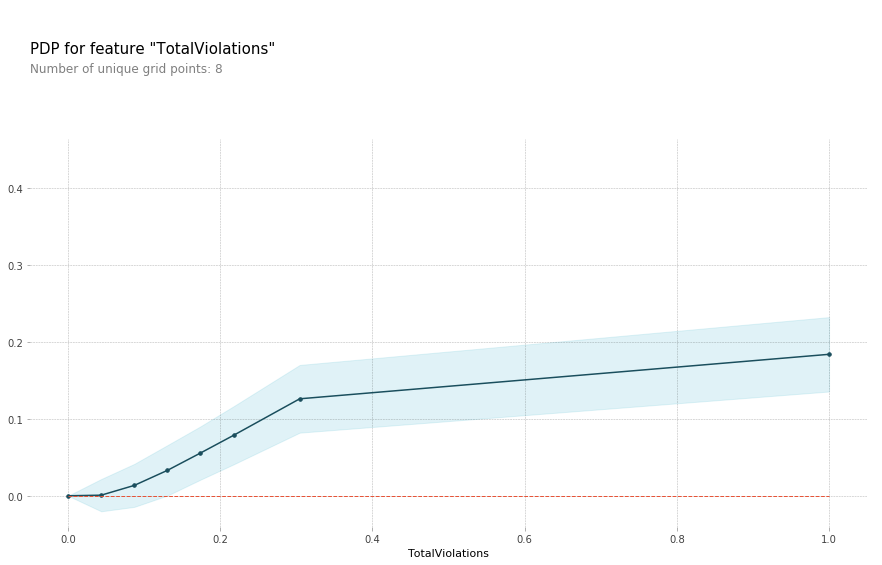

In [74]:
from pdpbox.pdp import pdp_isolate, pdp_plot

feature="TotalViolations"
pdp_isolated = pdp_isolate(model=best, dataset=X_train, model_features=X_train.columns, 
                           feature=[''])

pdp_plot(pdp_isolated, feature);

### Sort by `Sample order by output value` for top, and `output value` for side. This will allow you to see the outputs from Fail to Pass (1 to 0) and see how certain the model was. Click on any part of the plot to be prompted with the index of that specific row, then enter it below. 

In [75]:
# Create object that can calculate shap values
explainer = shap.TreeExplainer(best)

# Calculate Shap values
shap_values = explainer.shap_values(X_test)

# Plot Shap values
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values, X_test)

### Enter the index from the web prompt on the screen to see more detalied shap value breakdown. 

In [77]:
# Enter the index: 
index = 4025

# Create object that can calculate shap values
explainer = shap.TreeExplainer(best)

# Calculate Shap values
shap_values = explainer.shap_values(X_test.loc[index])

shap.initjs()
shap.force_plot(explainer.expected_value, shap_values, X_test.loc[index])